### Imports

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.manifold import TSNE

sns.set_style("darkgrid")

### Datasets

In [8]:
test = pd.read_csv("test_dataset.csv")
train = pd.read_csv("training_dataset.csv")
validation = pd.read_csv("validation_dataset.csv")

In [9]:
Cover_Type_Labels = [
    "Spruce",
    "Lodgepole",
    "Ponderosa",
    "Willow",
    "Aspen",
    "Douglas",
    "Krummholz",
]

In [10]:
train.columns

Index(['Id', 'Elevation', 'Aspect', 'Slope',
       'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology',
       'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon',
       'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points',
       'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3',
       'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3',
       'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8',
       'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12',
       'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16',
       'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
       'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
       'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28',
       'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32',
       'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
       'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_

In [11]:
train

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,8192,2976,85,23,95,72,2436,246,193,64,...,0,0,0,0,0,0,0,0,0,1
1,14089,3104,233,12,150,40,1503,200,251,186,...,0,0,0,0,0,0,0,0,0,1
2,10246,3385,160,7,937,204,1224,228,242,147,...,0,0,0,0,0,0,0,0,0,1
3,8686,3191,41,14,210,37,3207,221,208,119,...,1,0,0,0,0,0,0,0,0,1
4,9242,2821,297,4,85,1,992,208,238,169,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8281,9216,3294,328,13,624,192,3506,188,224,175,...,0,0,0,0,0,0,0,0,1,7
8282,7129,3390,24,6,216,13,3332,217,226,146,...,0,0,0,0,0,1,0,0,0,7
8283,9231,3350,100,18,175,-26,2121,247,212,88,...,0,0,0,0,0,0,1,0,0,7
8284,9656,3727,5,17,984,318,4934,195,204,143,...,0,0,0,0,0,0,0,0,1,7


In [12]:
train.describe()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.00000,...,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000
mean,7609.998431,2732.983104,155.366643,16.868694,225.249698,53.233888,1629.840574,213.732682,218.534999,133.00712,...,0.035723,0.031620,0.001328,0.008810,0.000845,0.003259,0.063481,0.056119,0.040068,4.561550
std,4291.741503,432.906958,108.392758,8.514811,213.670866,62.890107,1259.714393,30.675904,23.142959,46.73019,...,0.185610,0.174996,0.036413,0.093453,0.029055,0.056994,0.243840,0.230165,0.196130,1.789533
min,1.000000,1863.000000,0.000000,0.000000,0.000000,-134.000000,0.000000,58.000000,99.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,3889.500000,2350.000000,66.000000,10.000000,60.000000,5.000000,726.000000,197.000000,206.000000,103.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
50%,7479.500000,2720.500000,125.000000,16.000000,175.000000,34.000000,1273.000000,221.000000,222.000000,136.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000
75%,11349.750000,3099.750000,252.000000,23.000000,323.000000,84.000000,2155.000000,237.000000,235.000000,166.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000
max,15120.000000,3849.000000,360.000000,50.000000,1343.000000,547.000000,6508.000000,254.000000,254.000000,248.00000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


## Cleaning

In [13]:
train["Cover_Type"] = train["Cover_Type"] - 1

In [14]:
def remove_outliers(df, col, threshold=0.01, verbose=True):
    """Remove outliers from a dataframe column

    Parameters
    ----------
    df : pd.DataFrame
        Dataframe to remove outliers from
    col : str
        Column to remove outliers from
    threshold : float, optional
        Threshold for removing outliers, by default 0.01, Set to 1 to remove all outliers
        If the outliers make up less than this percentage of the data, they will be removed
    verbose : bool, optional
        Whether to print out how many outliers were removed, by default True

    Returns
    -------
    pd.DataFrame
        Dataframe with outliers removed
    """
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    outliers = df[(df[col] < q1 - 1.5 * iqr) | (df[col] > q3 + 1.5 * iqr)][col]
    if 0 < len(outliers) < threshold * len(df[col]):
        if verbose:
            print(f"Dropped {len(outliers)} outliers from {col}")
        df = df.drop(outliers.index)
    return df

The outliers should be removed. We'll remove them from the first 10 columns as they're numerical columns.

In [31]:
train_clean = train.copy()
for col in train.columns[:11]:
    train_clean = remove_outliers(train_clean, col)

Dropped 20 outliers from Slope
Dropped 43 outliers from Hillshade_3pm


In [32]:
print(len(train) - len(train_clean))

63


## EDA

### Functions

In [39]:
def plot_tsne(df: pd.DataFrame, target: str, labels: list = None):
    """Plot TSNE of dataframe with target as hue

    Parameters
    ----------
    df : pd.DataFrame
        dataframe to plot
    target : str
        target column name
    labels : list
        list of labels for target
    """
    tsne = TSNE(n_components=2, random_state=42)
    tsne_vectors = tsne.fit_transform(df.drop(target, axis=1))
    df_tsne = pd.DataFrame(tsne_vectors, columns=["x", "y"])
    df_tsne["labels"] = df[target]

    sns.scatterplot(x="x", y="y", hue="labels", data=df_tsne, palette="crest_r")
    plt.title(f"TSNE of {target}")
    plt.legend(labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
    plt.show()

### Exploration

In [18]:
df = train.copy()

In [19]:
df["Soil_Type"] = 0
for i in range(1, 41):
    df["Soil_Type"] += df["Soil_Type" + str(i)] * i
df.drop(["Soil_Type" + str(i) for i in range(1, 41)], axis=1, inplace=True)

df["Wilderness_Area"] = 0
for i in range(1, 5):
    df["Wilderness_Area"] += df["Wilderness_Area" + str(i)] * i
df.drop(["Wilderness_Area" + str(i) for i in range(1, 5)], axis=1, inplace=True)

hillshade = ["Hillshade_9am", "Hillshade_Noon", "Hillshade_3pm"]
df["Hillshade_Mean"] = df[hillshade].mean(axis=1)

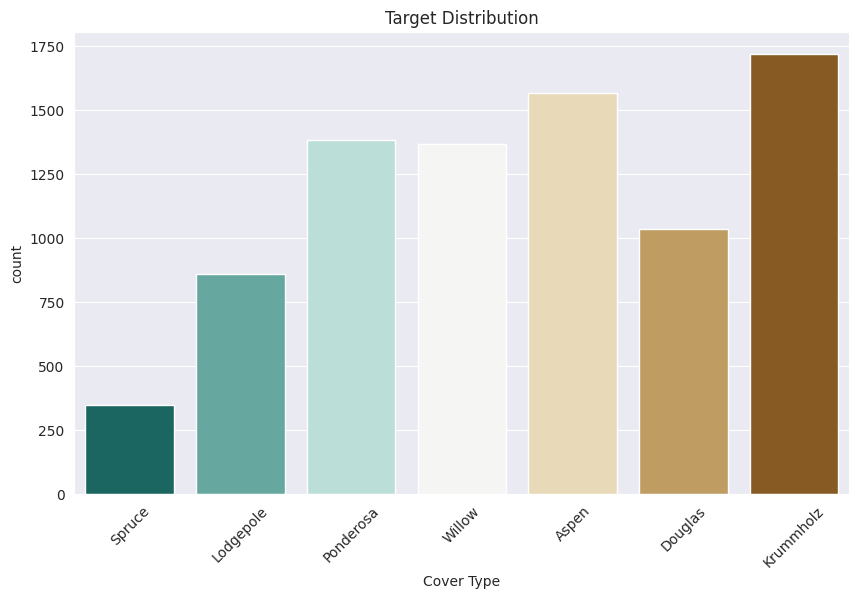

In [42]:
plt.figure(figsize=(10, 6))
sns.countplot(x="Cover_Type", data=df, palette="BrBG_r")
plt.xlabel("Cover Type")
plt.xticks(range(7), Cover_Type_Labels)
plt.title("Target Distribution")
plt.xticks(rotation=45)
plt.show()

In [21]:
columns = df.columns.drop(["Cover_Type"])

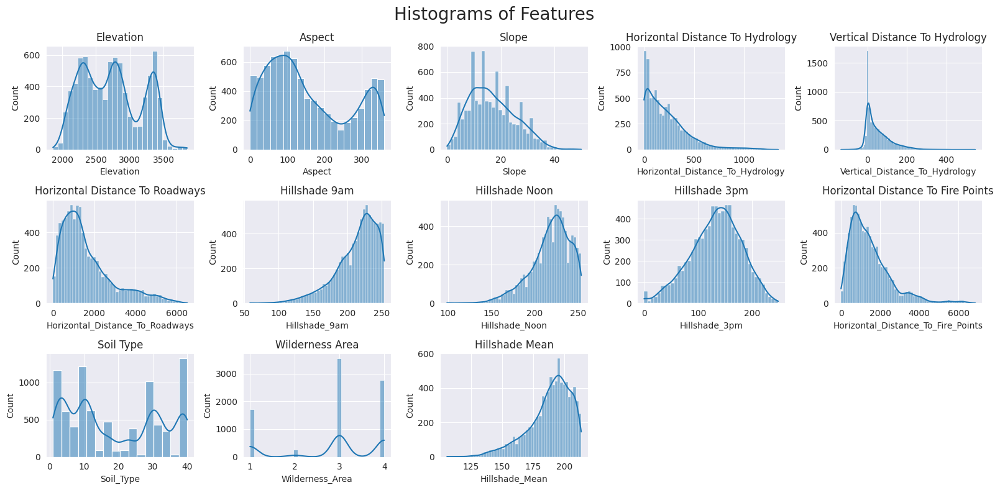

In [22]:
fig, axes = plt.subplots(3, 5, figsize=(16, 8))
fig.suptitle("Histograms of Features", fontsize=20)
axes = axes.flatten()
for i in range(1, len(columns)):
    sns.histplot(
        data=df,
        x=columns[i],
        ax=axes[i - 1],
        kde=True,
        legend=False,
    )
    axes[i - 1].set_title(columns[i].replace("_", " "))

axes[-1].set_axis_off()
axes[-2].set_axis_off()
plt.tight_layout()

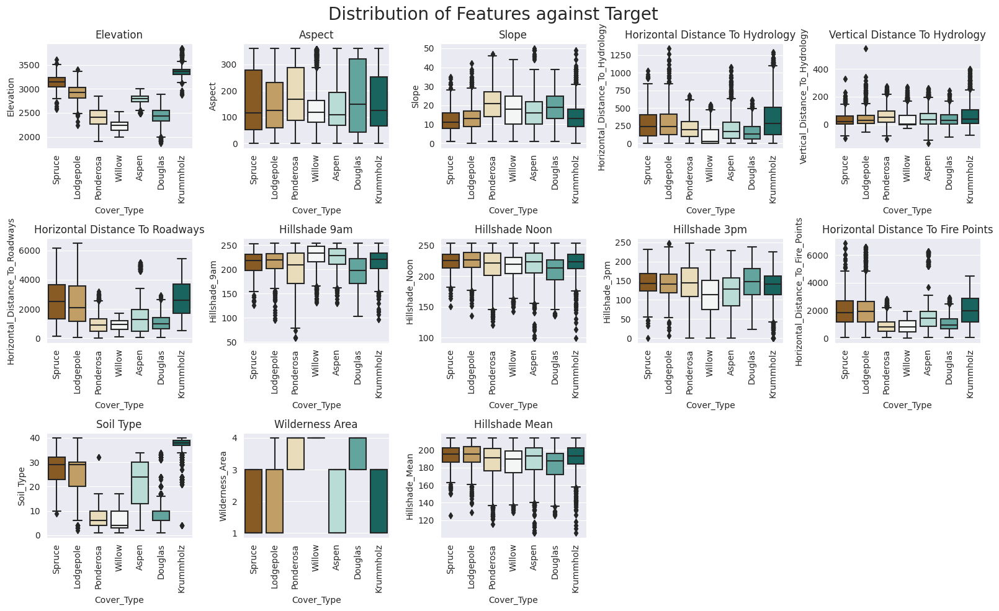

In [23]:
fig, axes = plt.subplots(3, 5, figsize=(16, 10))
fig.suptitle("Distribution of Features against Target", fontsize=20)
axes = axes.flatten()
columns = df.columns.drop(["Cover_Type"])

for i in range(1, len(columns)):
    sns.boxplot(
        x="Cover_Type",
        y=columns[i],
        data=df,
        ax=axes[i - 1],
        palette="BrBG",
    )
    axes[i - 1].set_title(columns[i].replace("_", " "))
    axes[i - 1].set_xticklabels(Cover_Type_Labels)
    axes[i - 1].tick_params(axis="x", rotation=90)

axes[-1].set_axis_off()
axes[-2].set_axis_off()
plt.tight_layout()

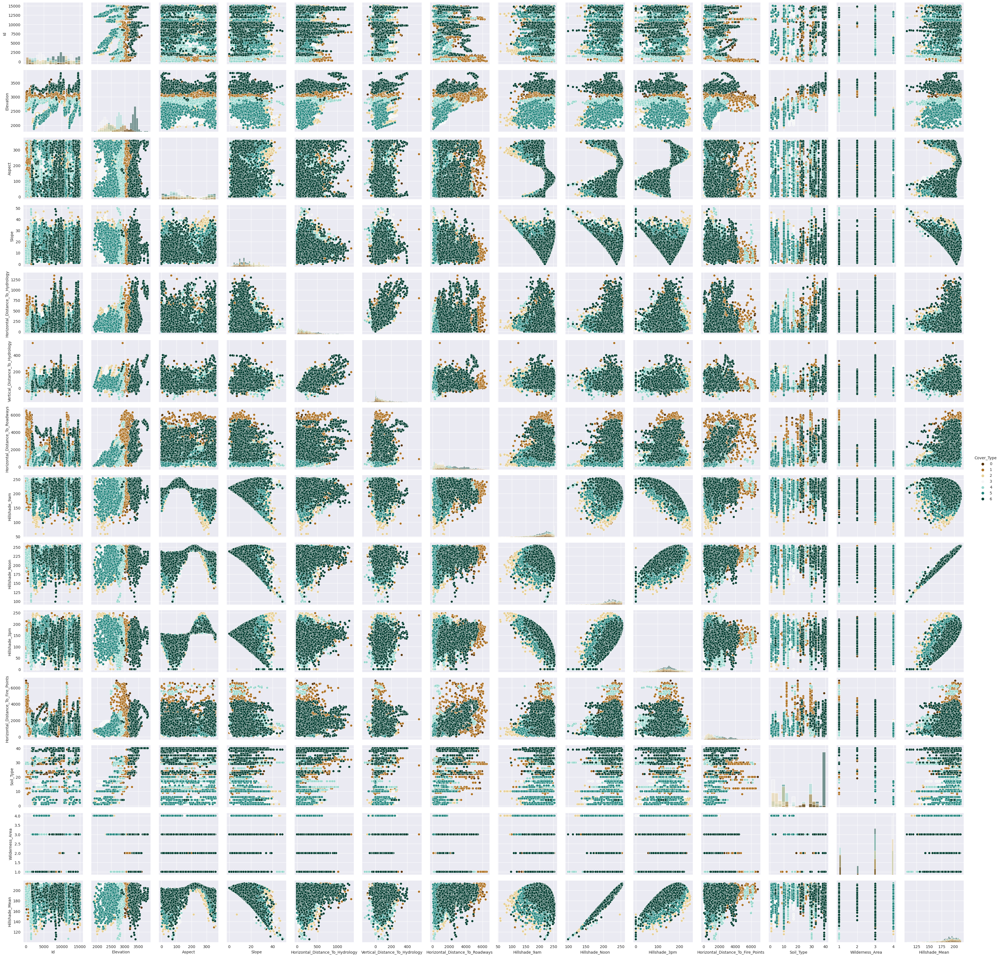

In [24]:
g = sns.PairGrid(
    df,
    vars=df.columns.drop(["Cover_Type"]),
    hue="Cover_Type",
    palette="BrBG",
)
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
plt.show()

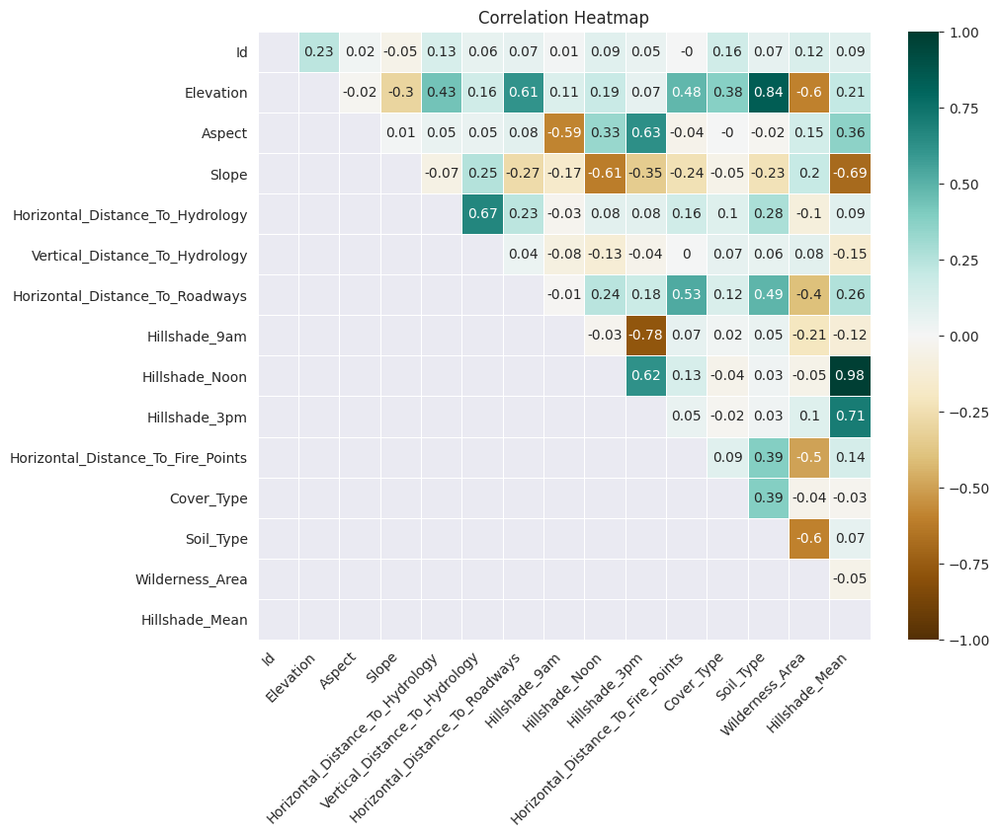

In [25]:
plt.figure(figsize=(10, 8))
corr_matrix = df.corr().round(2)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool)).T

sns.heatmap(
    corr_matrix, cmap="BrBG", linewidths=0.5, mask=mask, annot=True, vmin=-1, vmax=1
).grid(False)
plt.title("Correlation Heatmap")
plt.xticks(rotation=45, ha="right")
plt.show()

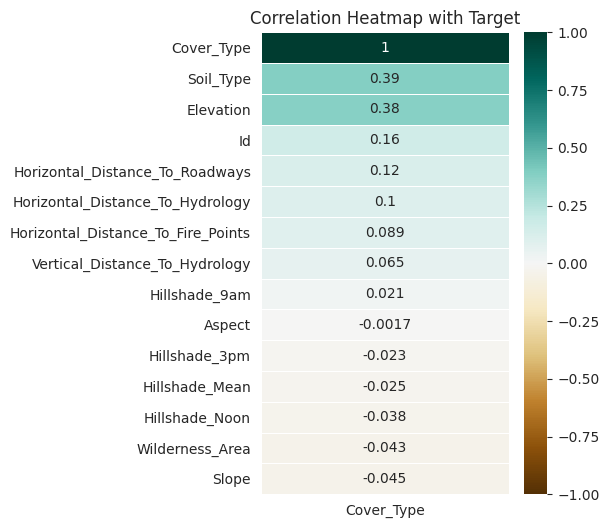

In [26]:
plt.figure(figsize=(4, 6))
sns.heatmap(
    df.corr()[["Cover_Type"]].sort_values(by="Cover_Type", ascending=False),
    cmap="BrBG",
    annot=True,
    linewidths=0.5,
    vmin=-1,
    vmax=1,
)
plt.title("Correlation Heatmap with Target")
plt.show()

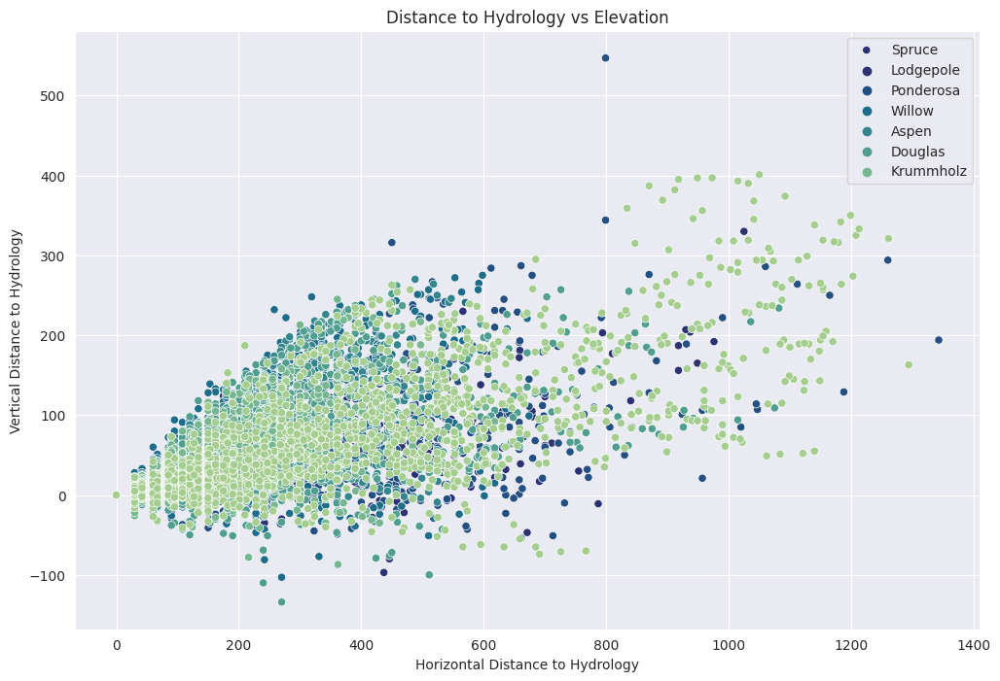

In [36]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x="Horizontal_Distance_To_Hydrology",
    y="Vertical_Distance_To_Hydrology",
    data=df,
    hue="Cover_Type",
    palette="crest_r",
)
plt.title("Distance to Hydrology vs Elevation")
plt.xlabel("Horizontal Distance to Hydrology")
plt.ylabel("Vertical Distance to Hydrology")
plt.legend(Cover_Type_Labels)
plt.show()

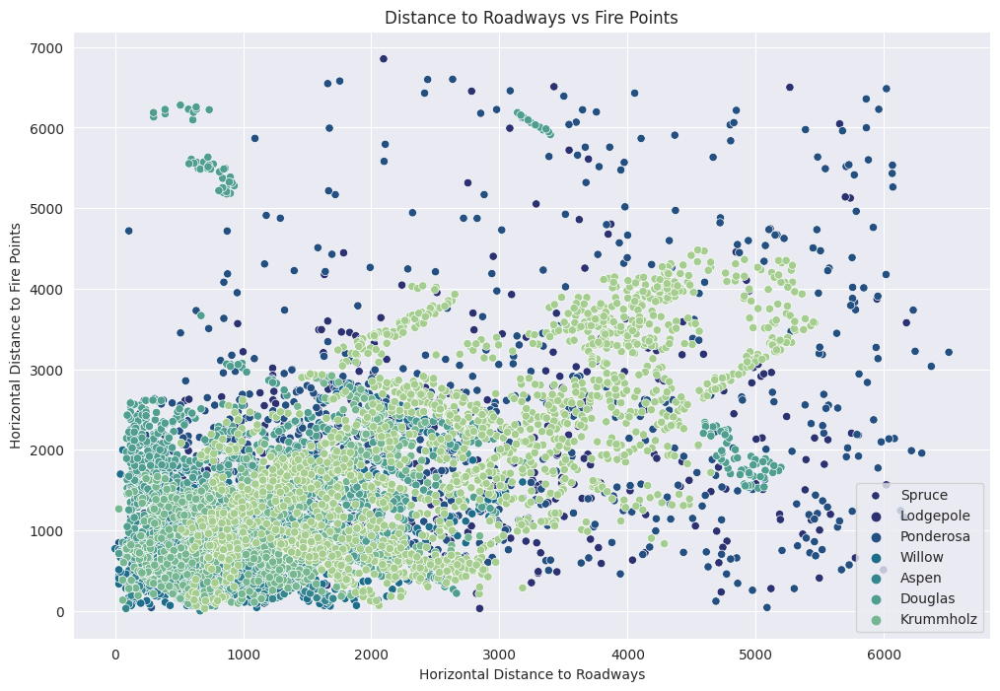

In [35]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x="Horizontal_Distance_To_Roadways",
    y="Horizontal_Distance_To_Fire_Points",
    data=df,
    hue="Cover_Type",
    palette="crest_r",
)
plt.title("Distance to Roadways vs Fire Points")
plt.xlabel("Horizontal Distance to Roadways")
plt.ylabel("Horizontal Distance to Fire Points")
plt.legend(Cover_Type_Labels)
plt.show()

/home/medhat/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/medhat/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


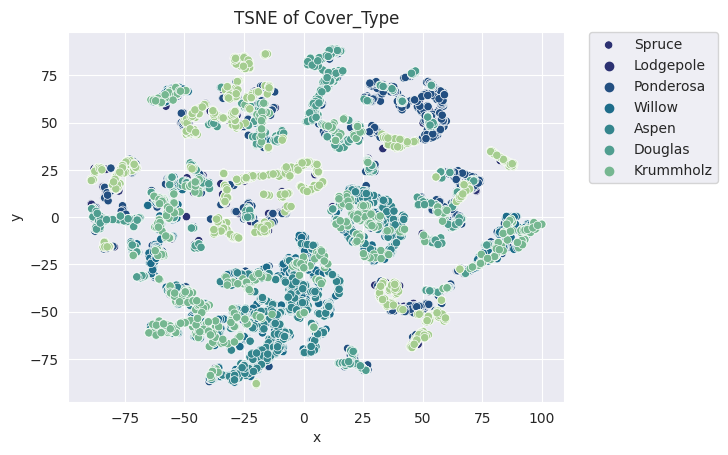

In [40]:
plot_tsne(train, "Cover_Type", Cover_Type_Labels)

/home/medhat/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/medhat/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


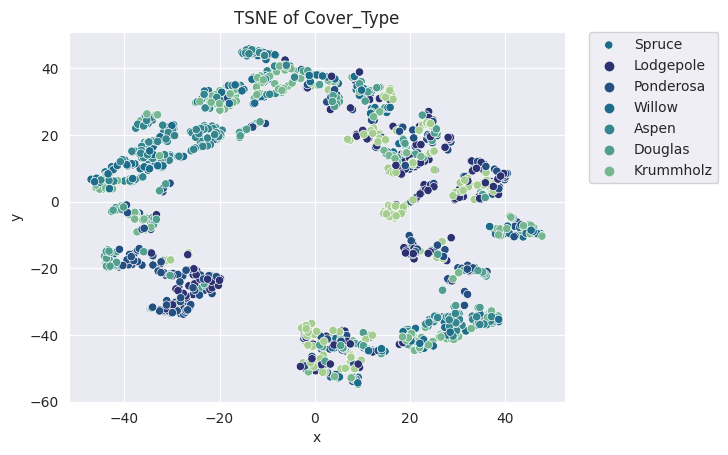

In [41]:
plot_tsne(test, "Cover_Type", Cover_Type_Labels)